<a href="https://colab.research.google.com/github/chuckmaini/colab/blob/main/app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install voila
!jupyter server extension enable voila --sys-prefix

     |████████████████████████████████| 1.9MB 7.7MB/s 
     |████████████████████████████████| 112kB 36.8MB/s 
     |████████████████████████████████| 194kB 29.2MB/s 
     |████████████████████████████████| 552kB 28.4MB/s 
     |████████████████████████████████| 71kB 9.6MB/s 
     |████████████████████████████████| 102kB 11.2MB/s 
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7667 sha256=32242e1018c5b8e33a74e49c5e41d8e3a9dbfe4d2499e3bfa22382123952de4c
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
Successfully built contextvars
ERROR: jupyter-server 1.2.2 has requirement tornado>=6.1.0, but you'll have tornado 5.1.1 which is incompatible.
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbc

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/jupyter_server/serverapp.py", line 53, in <module>
    assert tornado.version_info >= MIN_TORNADO
AssertionError

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/bin/jupyter-server", line 5, in <module>
    from jupyter_server.serverapp import main
  File "/usr/local/lib/python3.6/dist-packages/jupyter_server/serverapp.py", line 57, in <module>
    ) from e
ImportError: The Jupyter Server requires tornado >=6.1.0


In [2]:
!pip install -Uqq fastbook --upgrade
!pip install utils
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 9.1MB/s 
     |████████████████████████████████| 51kB 6.9MB/s 
     |████████████████████████████████| 1.2MB 19.1MB/s 
     |████████████████████████████████| 194kB 39.2MB/s 
     |████████████████████████████████| 460kB 36.5MB/s 
     |████████████████████████████████| 61kB 9.9MB/s 
ERROR: voila 0.2.6 has requirement nbconvert<7,>=6.0.0, but you'll have nbconvert 5.6.1 which is incompatible.
ERROR: jupyter-server 1.2.2 has requirement tornado>=6.1.0, but you'll have tornado 5.1.1 which is incompatible.
Mounted at /content/gdrive


In [3]:
from fastbook import *
from fastai.vision.widgets import *

In [5]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [6]:
img = PILImage.create(btn_upload.data[-1])

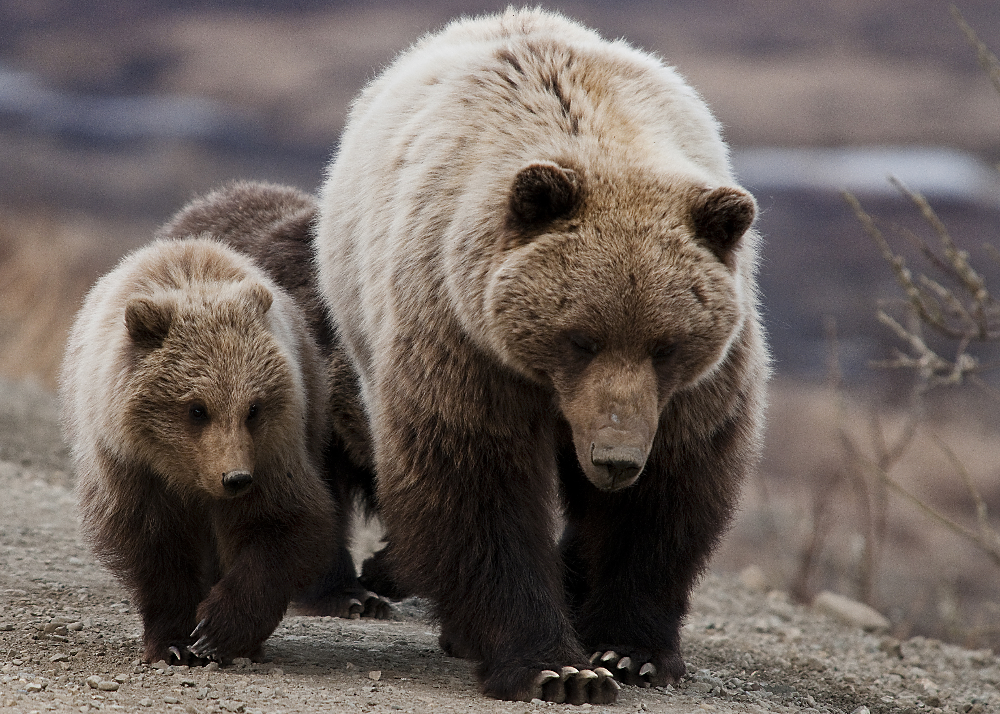

In [7]:
img

In [8]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [13]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [18]:
learn_inf = load_learner(gdrive/'export.pkl')

In [19]:
pred,pred_idx,probs = learn_inf.predict(img)

In [20]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.9999')

In [21]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [23]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [24]:
btn_upload = widgets.FileUpload()

In [25]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])